# Create connected graph about speaker

In [1]:
!export CUDA_VISIBLE_DEVICES=2


In [2]:
# from df.enhance import enhance, init_df, load_audio, save_audio
# from df.utils import download_file
# import torch

# model, df_state, _, _ = init_df()
#     # Download and open some audio file. You use your audio files here
# audio_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/00_standardization/NguoiPhanXu/Con nuôi ông trùm TẠO PHẢN, cài bom ÁM SÁT Phan Hải ｜ Người Phán Xử #13 ｜ Phim Hay VTV.wav'
# audio, _ = load_audio(audio_path, sr=df_state.sr())
# # Giả sử audio là một tensor 1D (mono), sr là sample rate
# segment_length_sec = 5 * 60  # 20 phút = 1200 giây
# segment_length_samples = segment_length_sec * df_state.sr()
# num_samples = audio.shape[-1]
# segments = []

# # Tách audio thành các đoạn 20 phút
# for start in range(0, num_samples, segment_length_samples):
#     end = min(start + segment_length_samples, num_samples)
#     segment = audio[..., start:end]
#     segments.append(segment)

# # Enhance từng đoạn và ghép lại
# enhanced_segments = []
# for segment in segments:
#     print(segment.shape)
#     enhanced_segment = enhance(model, df_state, segment)
#     enhanced_segments.append(enhanced_segment)

# # Ghép các đoạn lại thành 1 tensor
# final_audio = torch.cat(enhanced_segments, dim=-1)

# # Lưu ra file
# save_audio("enhanced_full.wav", final_audio, df_state.sr())

In [3]:
import random, os, json
from scipy.sparse.csgraph import connected_components
import numpy as np
from audio_processing.cosine_pair import cos_pair
def find_connected_components(data, threshold=0.75):
    """
    Phát hiện các thành phần liên thông dựa trên độ tương đồng cosine
    
    Args:
        data: List[dict] - Danh sách các dict chứa wav_name và embedding
        threshold: float - Ngưỡng cosine similarity để nối 2 node
        
    Returns:
        List[List[str]] - Danh sách các nhóm file WAV liên thông
    """
    n = len(data)
    embeddings = [np.array(item['embedding']) for item in data]
    
    # Tạo ma trận adjacency
    adjacency = np.zeros((n, n), dtype=bool)
    for i in range(n):
        for j in range(i+1, n):
            if cos_pair(embeddings[i], embeddings[j]) > threshold:
                adjacency[i][j] = True
                adjacency[j][i] = True
    
    # Tìm các thành phần liên thông
    _, labels = connected_components(adjacency, directed=False)
    
    # Gom nhóm kết quả
    components = {}
    for idx, label in enumerate(labels):
        components.setdefault(label, []).append(data[idx]['wav_name'])
    
    return list(components.values())

embedding_root = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/07_speaker_embedding'
for playlist_name in os.listdir(embedding_root):
    playlist_path = os.path.join(embedding_root, playlist_name)
    
    for episode_filename in os.listdir(playlist_path):
        # print(f"Processing {episode_filename} in {playlist_name}...")

        save_path = os.path.join('/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/episode', playlist_name, f"{episode_filename.rsplit('.', 1)[0]}.json")
        if os.path.exists(save_path):
            # print(f"File {save_path} already exist, skipping...")
            continue

        os.makedirs(os.path.join('/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/episode', playlist_name), exist_ok=True)
        episode_filepath = os.path.join(playlist_path, episode_filename)

        with open(episode_filepath, 'r') as f:
            data = json.load(f)
        
        dct_speaker = {}
        for key, value in data.items():
            speaker = value['speaker_id']
            if speaker not in dct_speaker:
                dct_speaker[speaker] = []
            dct_speaker[speaker].append({'wav_name': value['wav_name'], 'embedding': value['global_embedding']})

        # for key, value in dct_speaker.items():
        #     print(len(value))
        dct_episode = {}
        for speaker, items in dct_speaker.items():
            # print(speaker)
            # print(items)
            list_connected_components = max(find_connected_components(items), key=len)
            # print(f"Speaker: {speaker}, Components: {list_connected_components}")
            if len(list_connected_components)/10 >= 30:
                selected_components = random.sample(list_connected_components, int(len(list_connected_components)/10))
            elif len(list_connected_components) >= 30:
                selected_components = random.sample(list_connected_components, 30)
            else:
                selected_components = list_connected_components
                # continue
            embedding_map = {item['wav_name']: item['embedding'] for item in items}
            selected_embeddings = [embedding_map[name] for name in selected_components]
            average_embedding = np.mean(selected_embeddings, axis=0)
            if len(list_connected_components) <=4 :
                continue
            dct_episode[speaker] = {
                'average_embedding': average_embedding.tolist(),
                'wav_names': list_connected_components
            }
        # Save the processed data
        
        with open(save_path, 'w') as f:
            json.dump(dct_episode, f, ensure_ascii=False, indent=4)
        # break
    # break

INFO:speechbrain.utils.quirks:Applied quirks (see `speechbrain.utils.quirks`): [disable_jit_profiling, allow_tf32]
INFO:speechbrain.utils.quirks:Excluded quirks specified by the `SB_DISABLE_QUIRKS` environment (comma-separated list): []
/home4/tuanlha/EXpressiveTTS/dataRawProcess/audio_processing/cosine_pair.py:14: UserWarning: Module 'speechbrain.pretrained' was deprecated, redirecting to 'speechbrain.inference'. Please update your script. This is a change from SpeechBrain 1.0. See: https://github.com/speechbrain/speechbrain/releases/tag/v1.0.0
  from speechbrain.pretrained import EncoderClassifier
INFO:speechbrain.utils.fetching:Fetch hyperparams.yaml: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached
INFO:speechbrain.utils.fetching:Fetch custom.py: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached
/home/tuanlha/miniconda3/envs/TuanLHA/lib/python3.10/site-packages/speechbrain/utils/autocast.py:68: FutureWarning: `torch.cuda.

In [ ]:
import json, os
from audio_processing.cosine_pair import cos_pair
import numpy as np

embedding_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/07_speaker_embedding'
ls_diff = []
ls_same = []

for playlist_name in os.listdir(embedding_path):
    for episode_filename in os.listdir(os.path.join(embedding_path, playlist_name)):
        with open(os.path.join(embedding_path, playlist_name, episode_filename), 'r') as f:
            data = json.load(f)
        ls = []
        for key, value in data.items():
            ls.append({'wav_name': value['wav_name'], 'embedding': value['global_embedding'], 'speaker_id': value['speaker_id']})
        for i in range (len(ls)-1):
            for j in range(i+1, len(ls)):
                score = cos_pair(np.array(ls[i]['embedding']), np.array(ls[j]['embedding']))
                if ls[i]['speaker_id'] != ls[j]['speaker_id']:
                    ls_diff.append(score)
                else:
                    ls_same.append(score)
        # ls_max.append(max_diff)

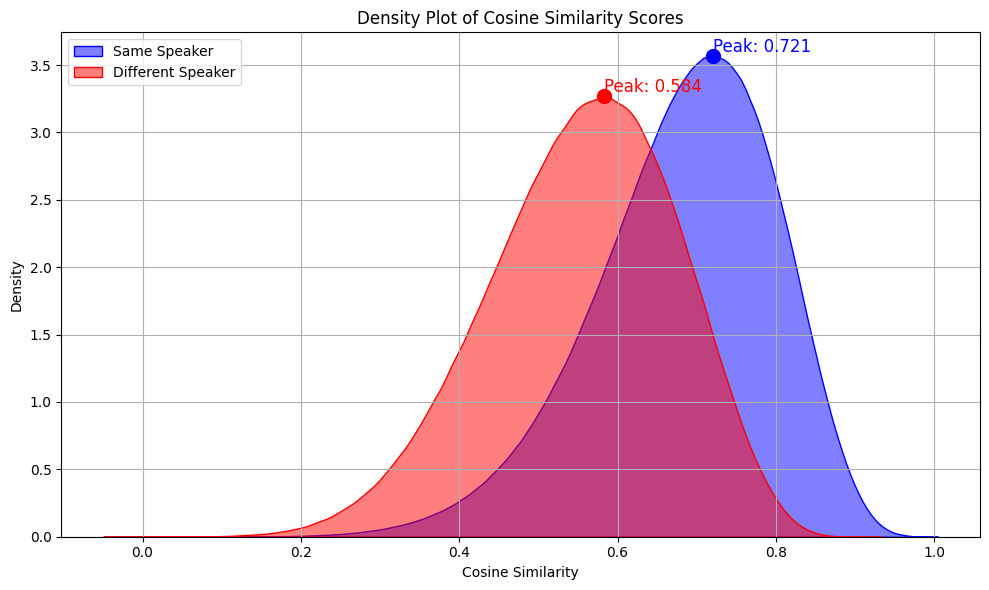

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Hàm tìm giá trị tập trung mật độ cao nhất
def find_density_peak(data):
    density = gaussian_kde(data)
    xs = np.linspace(min(data), max(data), 1000)
    ys = density(xs)
    peak_x = xs[np.argmax(ys)]
    peak_y = np.max(ys)
    return peak_x, peak_y

# Tính peak density cho 2 nhóm
peak_same_x, peak_same_y = find_density_peak(ls_same)
peak_diff_x, peak_diff_y = find_density_peak(ls_diff)

# Vẽ biểu đồ mật độ
plt.figure(figsize=(10,6))
sns.kdeplot(ls_same, label='Same Speaker', color='blue', fill=True, alpha=0.5)
sns.kdeplot(ls_diff, label='Different Speaker', color='red', fill=True, alpha=0.5)

# Đánh dấu peak density trên biểu đồ
plt.scatter(peak_same_x, peak_same_y, color='blue', s=100, marker='o')
plt.text(peak_same_x, peak_same_y, f'Peak: {peak_same_x:.3f}', color='blue', fontsize=12, verticalalignment='bottom')

plt.scatter(peak_diff_x, peak_diff_y, color='red', s=100, marker='o')
plt.text(peak_diff_x, peak_diff_y, f'Peak: {peak_diff_x:.3f}', color='red', fontsize=12, verticalalignment='bottom')

plt.title('Density Plot of Cosine Similarity Scores')
plt.xlabel('Cosine Similarity')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns

import matplotlib.pyplot as plt

# Visualize the distribution of ls_max
plt.figure(figsize=(10, 6))
sns.histplot(ls_diff, bins=50, kde=True, color='blue', alpha=0.7)
plt.title('Phân phối giá trị trong ls_max', fontsize=16)
plt.xlabel('Giá trị', fontsize=14)
plt.ylabel('Tần suất', fontsize=14)
plt.grid(alpha=0.3)
plt.show()

In [ ]:
mean_ls_max = np.mean(ls_diff)
std_ls_max = np.std(ls_diff)

print(f"Mean of ls_max: {mean_ls_max:.4f}")
print(f"Standard deviation of ls_max: {std_ls_max:.4f}")

# Global speaker labeling

In [1]:
episode_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/episode'
global_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/global'
import numpy as np
import os
import json
all_data = {}
map_wav_name = {}
for playlist_name in os.listdir(episode_path):
    playlist_path = os.path.join(episode_path, playlist_name)

    for file_name in os.listdir(playlist_path):
        if file_name.endswith('.json'):
            file_path3 = os.path.join(playlist_path, file_name)
            with open(file_path3, 'r', encoding='utf-8') as f:
                data = json.load(f)
                for id_key, value in data.items():
                    unique_key = f"{playlist_name}__{file_name[:-5]}__{id_key}"  # Ghép file_path và id_key
                    embeddings = value['average_embedding']
                    if isinstance(embeddings[0], list):
                        embedding = np.mean(np.array(embeddings), axis=0)
                    else:
                        embedding = np.array(embeddings)
                    all_data[unique_key] = embedding
                    map_wav_name[unique_key] = value['wav_names']
all_data

{'BaiHoc10PThongKe__Bài Toán Monty Hall - Gây Tranh Cãi Hàng Thập Kỷ__00': array([ 10.91290941,   7.02041264,  22.26756881,   0.12248536,
         12.66870171,   5.05925645,  12.3439944 ,  17.1859952 ,
        -10.74381603,   9.41279876,  18.48643025,   4.98840068,
          6.46412801,   5.42408602,  -8.14686267,   6.22077088,
         10.42721362,   9.3663568 ,  -2.07409479,  19.07591738,
         38.12969888,   1.51818117,   2.76641416,  22.77253895,
         13.75564291, -12.07318398,  -1.16341471,  -0.67711739,
          6.82006419, -27.3128057 ,  -0.48573116, -12.70589998,
         -5.65460602,  -4.76135213,  -0.26161864, -11.46256729,
         12.74044459,  13.73221865,  11.64051008,  70.88297335,
         20.29195938,  -0.78449776,   0.58908264, -32.88946025,
          1.46472407, -35.58550091,  -3.17868894, -18.54138449,
         48.75598294, -10.40340055,  18.4587834 ,  -1.77009639,
          3.58816436,   1.55435914,  -9.08525741, -11.74063593,
        -14.28736205,  -9.8345

In [2]:
len(all_data.keys())

1977

In [ ]:
import numpy as np
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt

# Extract embeddings and labels
embeddings = np.array(list(all_data.values()))
labels = [key.split('_')[-1] for key in all_data.keys()]  # Extract speaker IDs from unique keys

# Perform t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
reduced_embeddings = tsne.fit_transform(embeddings)

# Plot the t-SNE results
plt.figure(figsize=(10, 8))
for speaker in set(labels):
    indices = [i for i, label in enumerate(labels) if label == speaker]
    plt.scatter(reduced_embeddings[indices, 0], reduced_embeddings[indices, 1], label=f"Speaker {speaker}", alpha=0.7)

plt.title("t-SNE Visualization of Speaker Embeddings")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend()
plt.show()

In [4]:
from scipy.sparse.csgraph import connected_components
from audio_processing.cosine_pair import cos_pair

id_list = list(all_data.keys())
embeddings = [all_data[id_] for id_ in id_list]
n = len(id_list)

# Tạo ma trận adjacency
adjacency = np.zeros((n, n), dtype=bool)
threshold = 0.97

for i in range(n):
    for j in range(i+1, n):
        if cos_pair(embeddings[i], embeddings[j]) > threshold:
            adjacency[i][j] = True
            adjacency[j][i] = True

# Tìm các thành phần liên thông
_, labels = connected_components(adjacency, directed=False)

# Gom nhóm id theo thành phần liên thông
components = {}
for idx, label in enumerate(labels):
    components.setdefault(label, []).append(id_list[idx])

# Kết quả: list các nhóm id liên thông
list_connected_components = list(components.values())

INFO:speechbrain.utils.quirks:Applied quirks (see `speechbrain.utils.quirks`): [allow_tf32, disable_jit_profiling]
INFO:speechbrain.utils.quirks:Excluded quirks specified by the `SB_DISABLE_QUIRKS` environment (comma-separated list): []
/home4/tuanlha/EXpressiveTTS/dataRawProcess/audio_processing/cosine_pair.py:14: UserWarning: Module 'speechbrain.pretrained' was deprecated, redirecting to 'speechbrain.inference'. Please update your script. This is a change from SpeechBrain 1.0. See: https://github.com/speechbrain/speechbrain/releases/tag/v1.0.0
  from speechbrain.pretrained import EncoderClassifier
INFO:speechbrain.utils.fetching:Fetch hyperparams.yaml: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached
INFO:speechbrain.utils.fetching:Fetch custom.py: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached
/home/tuanlha/miniconda3/envs/TuanLHA/lib/python3.10/site-packages/speechbrain/utils/autocast.py:68: FutureWarning: `torch.cuda.

In [5]:
len(list_connected_components)

784

In [7]:
dct_connected_components = {}
for i, component in enumerate(list_connected_components):
    dct_connected_components[f'SPEAKER_{i+1}'] = []
    for id_ in component:   #'CoSuPhantichgame_ARG Happy Meat Farm - Trại động vật vui vẻ_00',  'CoSuPhantichgame_Alternate Watch： Thế thân ảo lòi trong Mandela Catalogue_00',
        playlist_name, episode_name, temp = id_.split('__')
        wav_ls = map_wav_name[id_]
        
        dct_connected_components[f'SPEAKER_{i+1}'].append({
                'playlist_name': playlist_name,
                'episode_name': episode_name,
                'wav_ls': wav_ls
            })
dct_connected_components


{'SPEAKER_1': [{'playlist_name': 'BaiHoc10PThongKe',
   'episode_name': 'Bài Toán Monty Hall - Gây Tranh Cãi Hàng Thập Kỷ',
   'wav_ls': ['SPEAKER_00_0.67_4.47_0.wav',
    'SPEAKER_00_5.11_8.89_1.wav',
    'SPEAKER_00_9.09_15.51_1.wav',
    'SPEAKER_00_9.09_15.51_2.wav',
    'SPEAKER_00_16.53_24.82_0.wav',
    'SPEAKER_00_16.53_24.82_2.wav',
    'SPEAKER_00_25.68_31.91_0.wav',
    'SPEAKER_00_25.68_31.91_1.wav',
    'SPEAKER_00_32.77_37.46_0.wav',
    'SPEAKER_00_32.77_37.46_1.wav',
    'SPEAKER_00_37.78_39.72_0.wav',
    'SPEAKER_00_40.46_45.76_0.wav',
    'SPEAKER_00_40.46_45.76_1.wav',
    'SPEAKER_00_46.91_51.16_0.wav',
    'SPEAKER_00_52.17_55.47_0.wav',
    'SPEAKER_00_55.87_61.52_0.wav',
    'SPEAKER_00_55.87_61.52_1.wav',
    'SPEAKER_00_62.25_65.25_0.wav',
    'SPEAKER_00_66.6_71.95_0.wav',
    'SPEAKER_00_66.6_71.95_1.wav',
    'SPEAKER_00_72.76_77.61_0.wav',
    'SPEAKER_00_72.76_77.61_1.wav',
    'SPEAKER_00_78.63_84.15_0.wav',
    'SPEAKER_00_78.63_84.15_1.wav',
    'SPEAK

In [8]:
num_audio_files = 0
for key, value in dct_connected_components.items():
    for item in value:
        num_audio_files += len(item['wav_ls'])
print(f"Total number of audio files: {num_audio_files}")


Total number of audio files: 165519


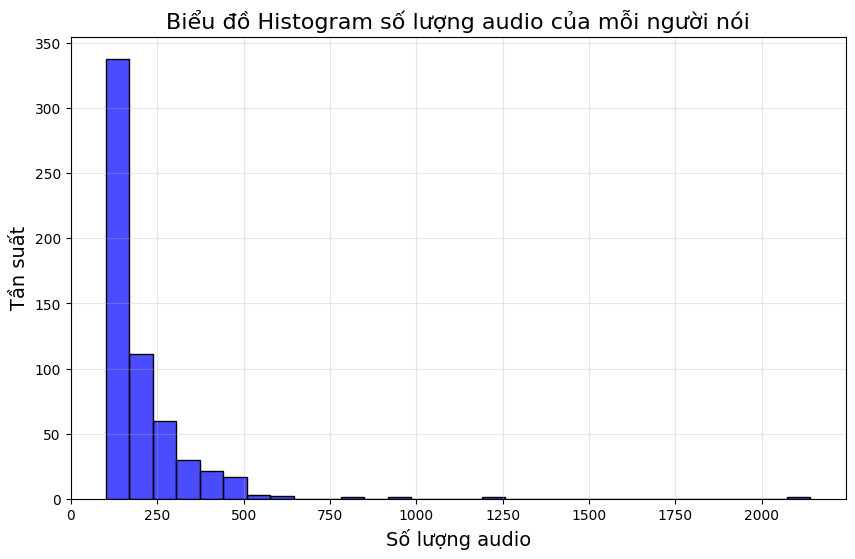

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
audio_counts = [sum(len(entry['wav_ls']) for entry in entries) for entries in dct_connected_components.values()]
# Vẽ biểu đồ histogram
plt.figure(figsize=(10, 6))
sns.histplot(audio_counts, bins=30, kde=False, color='blue', alpha=0.7)
plt.title('Biểu đồ Histogram số lượng audio của mỗi người nói', fontsize=16)
plt.xlabel('Số lượng audio', fontsize=14)
plt.ylabel('Tần suất', fontsize=14)
plt.grid(alpha=0.3)
plt.show()


In [16]:
mean_audio_counts = np.mean(audio_counts)
average_audio_counts = np.average(audio_counts)

print(f"Mean of audio_counts: {mean_audio_counts}")
print(f"Average of audio_counts: {average_audio_counts}")

Mean of audio_counts: 198.98976109215016
Average of audio_counts: 198.98976109215016


/tmp/ipykernel_9112/2266214504.py:25: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(audio_counts, shade=True, color='blue', alpha=0.7)


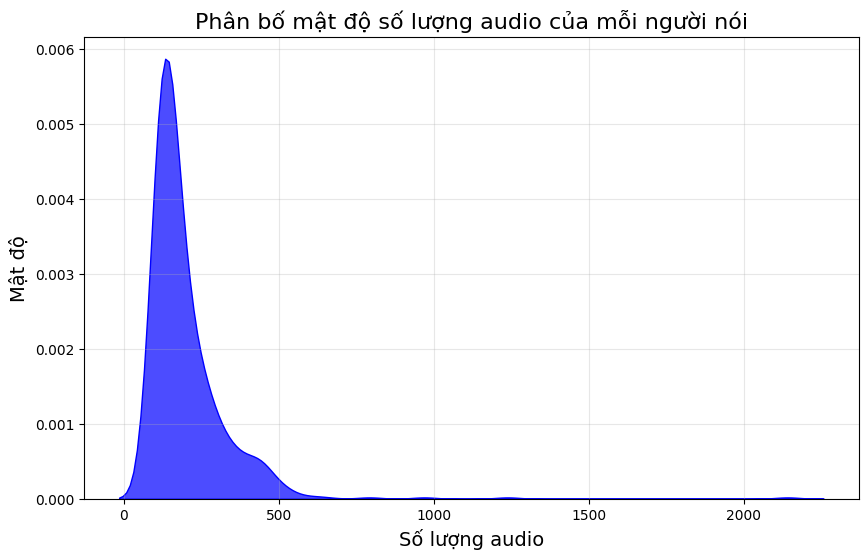

In [17]:
import numpy as np
import seaborn as sns
from scipy.stats import gaussian_kde

import matplotlib.pyplot as plt

audio_counts = []
# Tính số lượng audio của mỗi người nói
for entries in dct_connected_components.values():
    for entry in entries:
        entry['wav_ls'] = [wav for wav in entry['wav_ls'] if wav.endswith('.wav')]
        if len(entry['wav_ls']) > 100:
            audio_counts.append(len(entry['wav_ls']))
        

# audio_counts = [sum(len(entry['wav_ls']) for entry in entries) for entries in dct_connected_components.values()]

# Tính mật độ KDE bằng scipy
kde = gaussian_kde(audio_counts)
x_vals = np.linspace(min(audio_counts), max(audio_counts), 100)
y_vals = kde(x_vals)

# Vẽ biểu đồ
plt.figure(figsize=(10, 6))
sns.kdeplot(audio_counts, shade=True, color='blue', alpha=0.7)
plt.title('Phân bố mật độ số lượng audio của mỗi người nói', fontsize=16)
plt.xlabel('Số lượng audio', fontsize=14)
plt.ylabel('Mật độ', fontsize=14)
plt.grid(alpha=0.3)
plt.show()

In [18]:
cnt = 0
cnt_ok =0 
r = []
for key, value in dct_connected_components.items():
    cnt_wav = 0
    for item in value:
        cnt_wav += len(item['wav_ls'])
    if cnt_wav >= 30:
        cnt_ok += 1
    if cnt_wav <30:
        # print(f"Speaker {key} has less than 40 wav files, skipping...")
        continue
    cnt += 1
    print(f"Speaker {key} has {len(value)} episodes  with {cnt_wav} audio files.")
    r.append([cnt_wav, key, value])
cnt
# cnt = 0
# cnt_ok = 0
# tmp_dct = {}
# for key, value in dct_connected_components.items():
#     cnt_wav = 0
#     for item in value:
#         cnt_wav += len(item['wav_ls'])
#     if cnt_wav >= 40:
#         cnt_ok += 1
#     print(f"Speaker {key} has {len(value)} episodes  with {cnt_wav} audio files.")
# cnt_ok

Speaker SPEAKER_1 has 1 episodes  with 167 audio files.
Speaker SPEAKER_2 has 9 episodes  with 1325 audio files.
Speaker SPEAKER_3 has 1 episodes  with 125 audio files.
Speaker SPEAKER_4 has 4 episodes  with 659 audio files.
Speaker SPEAKER_5 has 2 episodes  with 254 audio files.
Speaker SPEAKER_8 has 1 episodes  with 102 audio files.
Speaker SPEAKER_9 has 1 episodes  with 136 audio files.
Speaker SPEAKER_10 has 49 episodes  with 7837 audio files.
Speaker SPEAKER_11 has 1 episodes  with 119 audio files.
Speaker SPEAKER_12 has 25 episodes  with 2596 audio files.
Speaker SPEAKER_13 has 1 episodes  with 154 audio files.
Speaker SPEAKER_14 has 4 episodes  with 2076 audio files.
Speaker SPEAKER_15 has 2 episodes  with 826 audio files.
Speaker SPEAKER_16 has 49 episodes  with 1481 audio files.
Speaker SPEAKER_18 has 3 episodes  with 163 audio files.
Speaker SPEAKER_21 has 1 episodes  with 66 audio files.
Speaker SPEAKER_22 has 58 episodes  with 5021 audio files.
Speaker SPEAKER_23 has 2 epis

356

In [19]:
import random
import os
import subprocess
from IPython.display import Audio, display


def process_and_play(speaker):
    base_path = "/home4/tuanlha/EXpressiveTTS/dataRawProcess/04_denoise"
    data = dct_connected_components[speaker]
    print(f'Speaker: {speaker}')
    
    if len(data) > 1:
        playlist_name1 = data[0]['playlist_name']
        episode_name1 = data[0]['episode_name']
        wav_ls1 = data[0]['wav_ls']
        path1 = f"{base_path}/{playlist_name1}/{episode_name1}/{wav_ls1[0]}"
        print(f"Playing first audio from {playlist_name1} - {episode_name1}: {wav_ls1[0]}")
        display(Audio(path1, autoplay=False))

        playlist_name2 = data[1]['playlist_name']
        episode_name2 = data[1]['episode_name']
        wav_ls2 = data[1]['wav_ls']
        path2 = f"{base_path}/{playlist_name2}/{episode_name2}/{wav_ls2[0]}"
        print(f"Playing second audio from {playlist_name2} - {episode_name2}: {wav_ls2[0]}")
        display(Audio(path2, autoplay=False))

    else:
        playlist_name = data[0]['playlist_name']
        episode_name = data[0]['episode_name']
        wav_ls = data[0]['wav_ls']
        print(f'Playlist audio files for {playlist_name}, episode {episode_name}:')
        chosen = wav_ls if len(wav_ls) < 2 else random.sample(wav_ls, 2)
        for wav_name in chosen:
            path = f"{base_path}/{playlist_name}/{episode_name}/{wav_name}"
            display(Audio(path, autoplay=False))

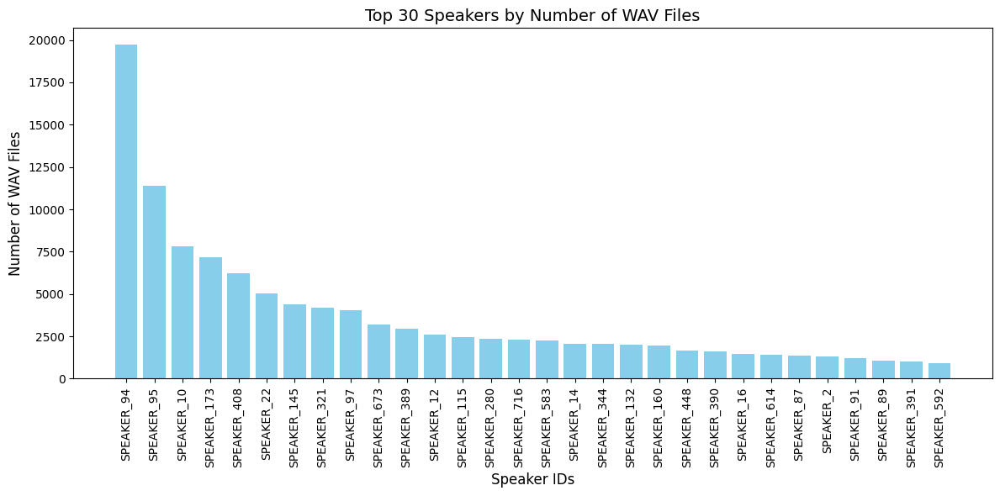

In [21]:
# Sắp xếp dct_tmp theo giá trị đầu tiên (số lượng wav files) giảm dần
sorted_dct_tmp = sorted(r, key=lambda x: x[0], reverse=True)
import matplotlib.pyplot as plt

# Extract data for plotting
speaker_ids = [item[1] for item in sorted_dct_tmp]
wav_counts = [item[0] for item in sorted_dct_tmp]

# Plot the data
plt.figure(figsize=(12, 6))
plt.bar(speaker_ids[:30], wav_counts[:30], color='skyblue')  # Limit to top 30 speakers for better visualization
plt.xticks(rotation=90, fontsize=10)
plt.xlabel('Speaker IDs', fontsize=12)
plt.ylabel('Number of WAV Files', fontsize=12)
plt.title('Top 30 Speakers by Number of WAV Files', fontsize=14)
plt.tight_layout()
plt.show()

In [22]:

# Chọn ra 100 phần tử đầu tiên
top_200_dct_tmp = sorted_dct_tmp[:200]

top_200_speaker = []
for cnt_wav, speaker, value in top_200_dct_tmp:
    top_200_speaker.append(speaker)


# In ra thông tin
for i, (cnt_wav, speaker, value) in enumerate(top_200_dct_tmp):
    print(f"{i+1}. Speaker: {speaker}, Number of wav files: {cnt_wav}")

1. Speaker: SPEAKER_94, Number of wav files: 19724
2. Speaker: SPEAKER_95, Number of wav files: 11409
3. Speaker: SPEAKER_10, Number of wav files: 7837
4. Speaker: SPEAKER_173, Number of wav files: 7170
5. Speaker: SPEAKER_408, Number of wav files: 6236
6. Speaker: SPEAKER_22, Number of wav files: 5021
7. Speaker: SPEAKER_145, Number of wav files: 4378
8. Speaker: SPEAKER_321, Number of wav files: 4190
9. Speaker: SPEAKER_97, Number of wav files: 4055
10. Speaker: SPEAKER_673, Number of wav files: 3188
11. Speaker: SPEAKER_389, Number of wav files: 2973
12. Speaker: SPEAKER_12, Number of wav files: 2596
13. Speaker: SPEAKER_115, Number of wav files: 2439
14. Speaker: SPEAKER_280, Number of wav files: 2342
15. Speaker: SPEAKER_716, Number of wav files: 2285
16. Speaker: SPEAKER_583, Number of wav files: 2272
17. Speaker: SPEAKER_14, Number of wav files: 2076
18. Speaker: SPEAKER_344, Number of wav files: 2057
19. Speaker: SPEAKER_132, Number of wav files: 2008
20. Speaker: SPEAKER_160, 

In [27]:
dct_episode_speaker_based = {}
for cnt_wav, speaker, value in top_200_dct_tmp:
    dct_episode_speaker_based[speaker] = []
    for item in value:
        if item['playlist_name'] not in dct_episode_speaker_based[speaker]:
            dct_episode_speaker_based[speaker].append(item['playlist_name'])
dct_episode_speaker_based

{'SPEAKER_94': ['CDMediaKhamPhaVuTruNguyenThuy'],
 'SPEAKER_95': ['CoSuPhantichgame', 'CoSuCottruyen'],
 'SPEAKER_10': ['BattleCryKhamPha'],
 'SPEAKER_173': ['HaveASipClean'],
 'SPEAKER_408': ['TacaChannel'],
 'SPEAKER_22': ['AiLaTrieuPhu'],
 'SPEAKER_145': ['DuyThanhNguyenCritical', 'DuyThanhNguyenFinance'],
 'SPEAKER_321': ['Long', 'TheReviewerClean', 'VanVo', 'VuiVe'],
 'SPEAKER_97': ['CoSuPhantichgame', 'CoSuCottruyen'],
 'SPEAKER_673': ['ViBanXungDang', 'ViBanXungDang2024'],
 'SPEAKER_389': ['SpiderumGiaoDuc', 'SpiderumQuanDiem'],
 'SPEAKER_12': ['BetterVersionVN'],
 'SPEAKER_115': ['CuThongThai'],
 'SPEAKER_280': ['MMDTIQCao'],
 'SPEAKER_716': ['VietNguyenAI'],
 'SPEAKER_583': ['TroChuyenCungDinhDoanClean'],
 'SPEAKER_14': ['BroNub100Ngay'],
 'SPEAKER_344': ['PerKhaiPha', 'PheGame'],
 'SPEAKER_132': ['DuongFGTongHop'],
 'SPEAKER_160': ['HocVienBoVaGau'],
 'SPEAKER_448': ['THPTQGDiaLy'],
 'SPEAKER_390': ['SpiderumGiaoDuc', 'SpiderumQuanDiem'],
 'SPEAKER_16': ['CoBaBinhDuong'],
 'S

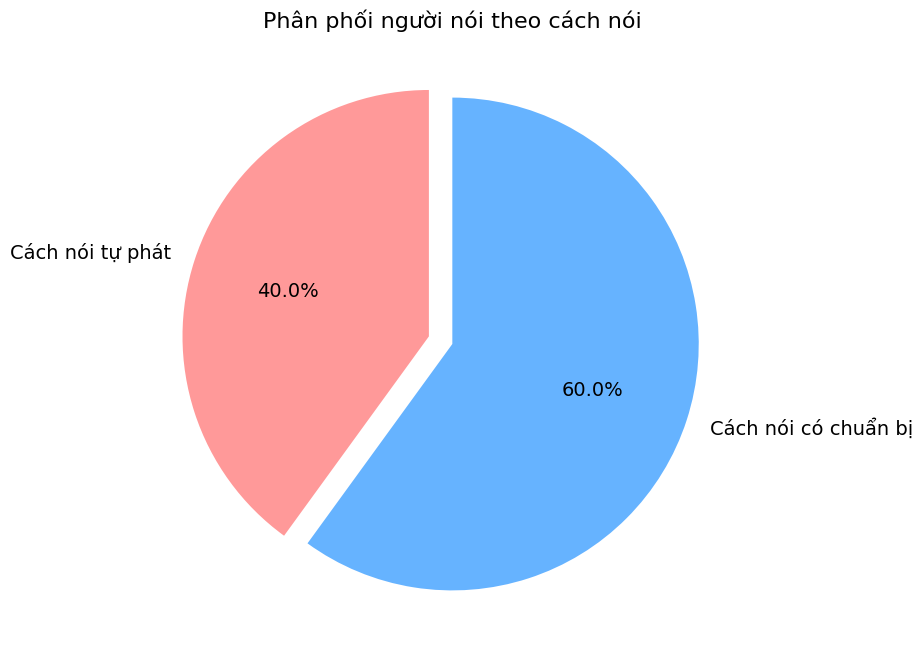

In [28]:
import matplotlib.pyplot as plt

# Dữ liệu
labels = ['Cách nói tự phát', 'Cách nói có chuẩn bị']
sizes = [40, 60]
colors = ['#ff9999', '#66b3ff']  # Màu sắc cho các phần
explode = (0.1, 0)  # Tách phần "Cách nói tự phát" ra một chút

# Vẽ biểu đồ hình tròn
plt.figure(figsize=(8, 8))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, textprops={'fontsize': 14})
plt.title('Phân phối người nói theo cách nói', fontsize=16)
plt.show()

In [25]:
import pandas as pd

rows = []
for speaker, entries in dct_connected_components.items():
    if speaker not in top_200_speaker:
        continue
    for entry in entries:
        playlist_name = entry['playlist_name']
        episode_name = entry['episode_name']
        for wav_name in entry['wav_ls']:
            rows.append({
                'speaker': speaker,
                'playlist_name': playlist_name,
                'episode_name': episode_name,
                'wav_name': wav_name
            })

df = pd.DataFrame(rows)
df.to_csv('/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Analysys_data/speaker_data_ver200.csv', index=False)


# import pandas as pd

# rows = []
# for speaker, entries in dct_connected_components.items():
#     for entry in entries:
#         playlist_name = entry['playlist_name']
#         episode_name = entry['episode_name']
#         for wav_name in entry['wav_ls']:
#             rows.append({
#                 'speaker': speaker,
#                 'playlist_name': playlist_name,
#                 'episode_name': episode_name,
#                 'wav_name': wav_name
#             })

# df = pd.DataFrame(rows)
# df.to_csv('/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Analysys_data/speaker_data_verfull.csv', index=False)



## Analysis by category

In [26]:
df= pd.read_csv('/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Analysys_data/speaker_data_ver200.csv')
df

,speaker,playlist_name,episode_name,wav_name
0,SPEAKER_1,BaiHoc10PThongKe,Bài Toán Monty Hall - Gây Tranh Cãi Hàng Thập Kỷ,SPEAKER_00_0.67_4.47_0.wav
1,SPEAKER_1,BaiHoc10PThongKe,Bài Toán Monty Hall - Gây Tranh Cãi Hàng Thập Kỷ,SPEAKER_00_5.11_8.89_1.wav
2,SPEAKER_1,BaiHoc10PThongKe,Bài Toán Monty Hall - Gây Tranh Cãi Hàng Thập Kỷ,SPEAKER_00_9.09_15.51_1.wav
3,SPEAKER_1,BaiHoc10PThongKe,Bài Toán Monty Hall - Gây Tranh Cãi Hàng Thập Kỷ,SPEAKER_00_9.09_15.51_2.wav
4,SPEAKER_1,BaiHoc10PThongKe,Bài Toán Monty Hall - Gây Tranh Cãi Hàng Thập Kỷ,SPEAKER_00_16.53_24.82_0.wav
...,...,...,...,...
152115,SPEAKER_733,VTV7DungDeTreCoDon,"Vượt qua vấp ngã, cô giáo đã làm điều này giúp...",SPEAKER_00_755.49_756.89_0.wav
152116,SPEAKER_733,VTV7DungDeTreCoDon,"Vượt qua vấp ngã, cô giáo đã làm điều này giúp...",SPEAKER_00_758.07_765.85_0.wav
152117,SPEAKER_733,VTV7DungDeTreCoDon,"Vượt qua vấp ngã, cô giáo đã làm điều này giúp...",SPEAKER_00_766.22_776.57_0.wav
152118,SPEAKER_733,VTV7DungDeTreCoDon,"Vượt qua vấp ngã, cô giáo đã làm điều này giúp...",SPEAKER_00_766.22_776.57_1.wav


In [12]:
import pandas as pd
import os

# Giả sử df đã được khai báo và có các cột: speaker, playlist_name, episode_name, wav_name

def load_nisqa_dict(playlist_name, episode_name):
    file_path = f"/home4/tuanlha/EXpressiveTTS/dataRawProcess/05_data_extract/{playlist_name}/{episode_name}_NISQA_results.csv"
    if os.path.exists(file_path):
        df_nisqa = pd.read_csv(file_path)
        return dict(zip(df_nisqa['deg'], df_nisqa['mos_pred']))
    return {}

def load_wvmos_dict(playlist_name, episode_name):
    file_path = f"/home4/tuanlha/EXpressiveTTS/dataRawProcess/05_data_extract/{playlist_name}/{episode_name}_wvmos.csv"
    if os.path.exists(file_path):
        df_wvmos = pd.read_csv(file_path)
        return dict(zip(df_wvmos['audio_path'], df_wvmos['score']))
    return {}

# Lấy danh sách các cặp playlist_name và episode_name duy nhất
unique_pairs = df[['playlist_name', 'episode_name']].drop_duplicates()

# Tạo dict ánh xạ cho từng cặp
nisqa_dicts = {}
wvmos_dicts = {}
for _, row in unique_pairs.iterrows():
    playlist = row['playlist_name']
    episode = row['episode_name']
    nisqa_dicts[(playlist, episode)] = load_nisqa_dict(playlist, episode)
    wvmos_dicts[(playlist, episode)] = load_wvmos_dict(playlist, episode)

# Hàm tra cứu nhanh
def get_mos_pred_fast(row):
    key = (row['playlist_name'], row['episode_name'])
    return nisqa_dicts.get(key, {}).get(row['wav_name'], None)

def get_wv_pred_fast(row):
    key = (row['playlist_name'], row['episode_name'])
    return wvmos_dicts.get(key, {}).get(row['wav_name'], None)

# Thêm 2 cột mới
df['mos_pred'] = df.apply(get_mos_pred_fast, axis=1)
df['wv_pred'] = df.apply(get_wv_pred_fast, axis=1)
df.to_csv('/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Analysys_data/speaker_data_200.csv', index=False)


In [ ]:
# Tính toán số lượng audio cho mỗi speaker
speaker_audio_count = {speaker: sum(len(entry['wav_ls']) for entry in entries) for speaker, entries in tmp_dct.items()}
speaker_audio_count

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Giả sử speaker_audio_count là một dictionary chứa số lượng audio của từng người
audio_counts = np.array(list(speaker_audio_count.values()))

# Tính toán số lượng audio trung bình trên mỗi người
average_audio_per_speaker = np.mean(audio_counts)

# Tính mật độ KDE bằng scipy
kde = gaussian_kde(audio_counts)
x_vals = np.linspace(min(audio_counts), max(audio_counts), 1000)
y_vals = kde(x_vals)

# Tìm giá trị x có mật độ lớn nhất
max_density_index = np.argmax(y_vals)
max_density_x = x_vals[max_density_index]

# Vẽ biểu đồ
plt.figure(figsize=(10, 6))
sns.kdeplot(audio_counts, shade=True, color='blue', alpha=0.7)
plt.axvline(average_audio_per_speaker, color='red', linestyle='dashed', linewidth=1, label=f'Trung bình: {average_audio_per_speaker:.2f}')
plt.axvline(max_density_x, color='green', linestyle='dashed', linewidth=1, label=f'Mật độ lớn nhất tại: {max_density_x:.2f}')
plt.title('Phân phối mật độ số lượng audio trên mỗi người', fontsize=16)
plt.xlabel('Số lượng audio', fontsize=14)
plt.ylabel('Mật độ', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

print(f'Giá trị số lượng audio có mật độ lớn nhất là: {max_density_x:.2f}')


# T-SNE của từng episode

In [ ]:
file_paths = [file_path2, file_path3, file_path4, file_path5]
titles = ["t-SNE cho 2 người", "t-SNE cho 3 người", "t-SNE cho 4 người", "t-SNE cho 5 người"]

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for i, (file_path, title) in enumerate(zip(file_paths, titles)):
    with open(file_path, 'r') as f:
        data = json.load(f)
    list_embeddings = np.array([value['global_embedding'] for value in data.values() if 'global_embedding' in value])
    labels = [value['speaker_id'] for value in data.values() if 'global_embedding' in value]
    
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    reduced_embeddings = tsne.fit_transform(list_embeddings)
    
    unique_speakers = set(labels)
    for speaker in unique_speakers:
        indices = [j for j, label in enumerate(labels) if label == speaker]
        axes[i].scatter(reduced_embeddings[indices, 0], reduced_embeddings[indices, 1], label=f"Speaker {speaker}", alpha=0.7)
    
    axes[i].set_title(title, fontsize=18)
    axes[i].set_xlabel("Dimension 1", fontsize=16)
    axes[i].set_ylabel("Dimension 2", fontsize=16)
    axes[i].legend(fontsize=12)

plt.tight_layout()
plt.show()

# TSNE tất cả các nhúgn đại diện

In [ ]:
folder_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/episode/CuThongThai/9 Mẹo cứu túi Tiền cho người trẻ ｜ Biết sớm Giàu sớm.json'
import json
with open(folder_path, 'r') as f:
    data = json.load(f)

data

In [ ]:
folder_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/episode'

In [ ]:
import os
import json
import numpy as np
from scipy.sparse.csgraph import connected_components
from audio_processing.cosine_pair import cos_pair

# Define paths
episode_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/episode'
global_path = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/08_connect_speaker/global'

# Initialize global data
global_speaker_embeddings = {}
global_mapping = {}

# Iterate through playlists and episodes
for playlist_name in os.listdir(episode_path):
    playlist_path = os.path.join(episode_path, playlist_name)
    
    for file_name in os.listdir(playlist_path):
        if file_name.endswith('.json'):
            file_path = os.path.join(playlist_path, file_name)
            
            # Load episode data
            with open(file_path, 'r', encoding='utf-8') as f:
                data = json.load(f)
                
                # Process each speaker in the episode
                for speaker_id, value in data.items():
                    embedding = np.array(value['average_embedding'])
                    
                    # Check if the speaker is already in the global mapping
                    matched = False
                    for global_id, global_embedding in global_speaker_embeddings.items():
                        if cos_pair(embedding, global_embedding) > 0.97:  # Threshold for similarity
                            global_mapping[f"{playlist_name}_{file_name}_{speaker_id}"] = global_id
                            matched = True
                            break
                    
                    # If not matched, add as a new global speaker
                    if not matched:
                        new_global_id = f"GLOBAL_{len(global_speaker_embeddings)}"
                        global_speaker_embeddings[new_global_id] = embedding
                        global_mapping[f"{playlist_name}_{file_name}_{speaker_id}"] = new_global_id

# Save global speaker embeddings and mapping to server
os.makedirs(global_path, exist_ok=True)

global_embeddings_path = os.path.join(global_path, 'global_speaker_embeddings.json')
with open(global_embeddings_path, 'w', encoding='utf-8') as f:
    json.dump({key: value.tolist() for key, value in global_speaker_embeddings.items()}, f, ensure_ascii=False, indent=4)

global_mapping_path = os.path.join(global_path, 'global_mapping.json')
with open(global_mapping_path, 'w', encoding='utf-8') as f:
    json.dump(global_mapping, f, ensure_ascii=False, indent=4)

print("Global speaker embeddings and mapping have been saved to the server.")

# Di chuyển dữ liệu sẽ push

In [23]:
import pandas as pd
import shutil
import os
from concurrent.futures import ThreadPoolExecutor
import tqdm

df = pd.read_csv('/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Analysys_data/speaker_data.csv')
df = df.dropna()
audio_folder = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/04_denoise'
save_folder = '/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Push_data'
def process_row(row):
    speaker = row['speaker']
    playlist_name = row['playlist_name']
    episode_name = row['episode_name']
    wav_name = row['wav_name']
    base_name = wav_name.rsplit('.', 1)[0]
    os.makedirs(os.path.join(save_folder, speaker), exist_ok=True)
    wav_path = os.path.join(audio_folder, playlist_name, episode_name, f'{base_name}.wav')
    des_path = os.path.join(save_folder, speaker, f'{playlist_name}__{episode_name}__{base_name}.wav')
    shutil.copy(wav_path, des_path)

with ThreadPoolExecutor(max_workers=12) as executor:
    list(tqdm.tqdm(executor.map(process_row, [row for _, row in df.iterrows()]), total=len(df)))
    

100%|██████████| 147643/147643 [11:52<00:00, 207.28it/s]


In [ ]:
import subprocess

start = 42
for i in range (67):
    command = [
            "cp", "-r",
            f"/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Push_data/SPEAKER_{start+i}", f"SPEAKER_{start+i}"
        ]
    
    print(" ".join(command))
    subprocess.run(command, cwd="/home4/tuanlha/EXpressiveTTS/dataRawProcess/_Push_zip")